In [1]:
from torchvision import datasets, transforms
from skimage.color import rgb2lab, rgb2gray
from skimage import io
import torch.utils.data as data
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
from PIL import Image
import os

scale_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomCrop(224),
    #transforms.ToTensor()
])


class TrainImageFolder(datasets.ImageFolder):
    #def __init__(self, data_dir, transform):
    #   self.file_list=os.listdir(data_dir)
    #   self.transform=transform
    #   self.data_dir=data_dir
    def __getitem__(self, index):
        try:
            path,_=self.imgs[index]
            img=self.loader(path)
            #img=Image.open(self.data_dir+'/'+self.file_list[index])
            if self.transform is not None:
                img_original = self.transform(img)
                img_resize=transforms.Resize(56)(img_original)
                img_original = np.asarray(img_original)
                img_lab = rgb2lab(img_resize)
                #img_lab = (img_lab + 128) / 255
                img_ab = img_lab[:, :, 1:3]
                img_ab = torch.from_numpy(img_ab.transpose((2, 0, 1)))
                #print('img_ori',img_original.shape)
                #print('img_ab',img_ab.size())
                img_original = rgb2lab(img_original)[:,:,0]-50.
                img_original = torch.from_numpy(img_original)
                return img_original, img_ab
        except:
            pass
    def __len__(self):
        return len(self.imgs)

In [2]:
import os

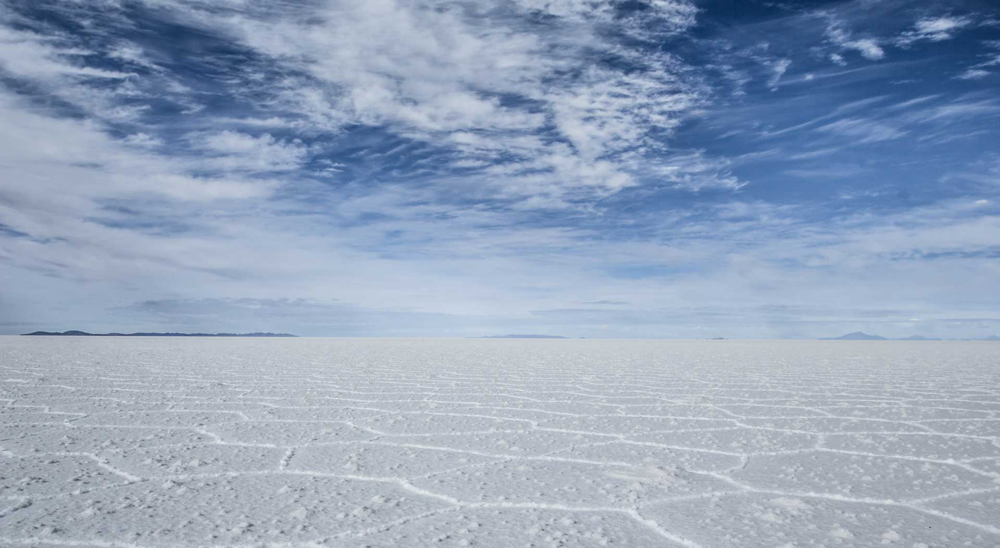

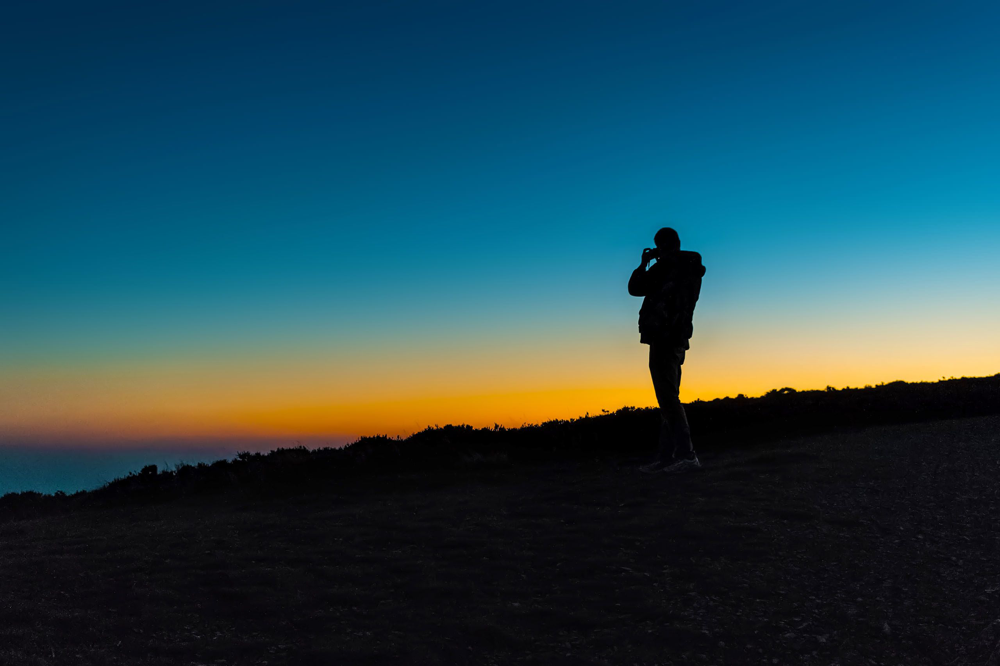

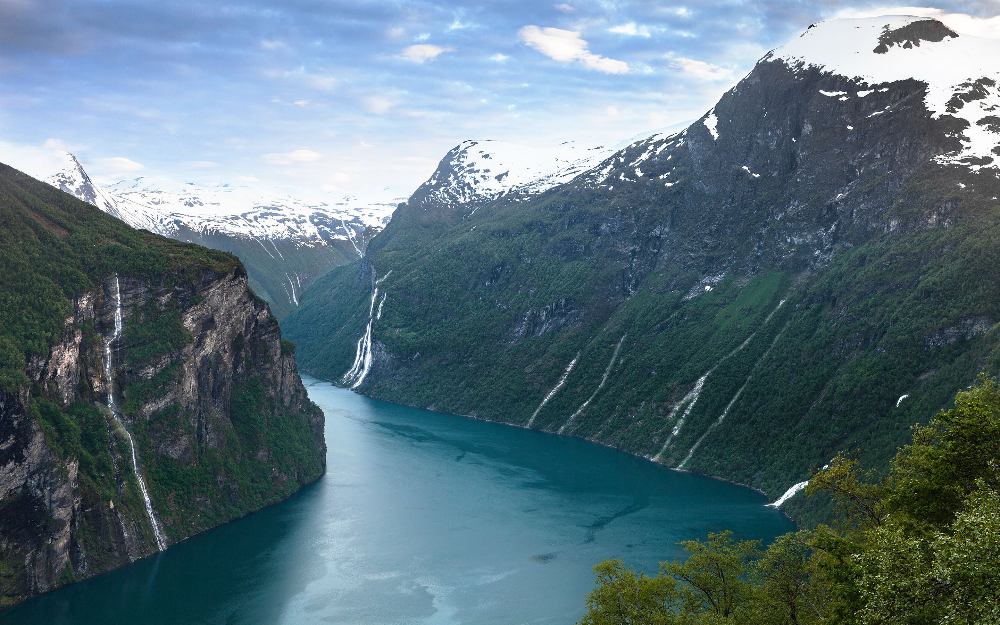

In [2]:
# make gray images
for file in os.listdir('train_images/color'):
    img = Image.open('../git_folder/train_images/color/' + file) #.convert('LA')
    display( img )
#     img.save('../git_folder/train_images/gray/'+im_path[:-4]+'.png')

In [3]:
# # size (3,2,224,224); Image preprocessing, normalization for the pretrained resnet
train_set = TrainImageFolder( "train_images", scale_transform )


# # Build data loader
data_loader = torch.utils.data.DataLoader([train_set[0]], batch_size = 1, shuffle = True, num_workers = 6)

In [5]:
## (3 images, dispalys gray, H 224, W 224) or ((3 images, display ab, 2 channels, H 56, W 224))
[train_set[0][i].shape for i in range(len(train_set[0])) ]

[torch.Size([224, 224]), torch.Size([2, 56, 56])]

In [6]:
# len 2: ([0], 1, 224, 224) and ([1], 1, 2, 56, 56)
list(data_loader)[0][1].shape

torch.Size([1, 2, 56, 56])

In [10]:
import color_model as cld

learning_rate = 1e-3
num_epochs = 2


NameError: name 'args' is not defined

In [ ]:
# Build the models
model=nn.DataParallel(Color_model()).cuda()
#model.load_state_dict(torch.load('../model/models/model-171-216.ckpt'))
encode_layer=NNEncLayer()
boost_layer=PriorBoostLayer()
nongray_mask=NonGrayMaskLayer()
# Loss and optimizer
criterion = nn.CrossEntropyLoss(reduce=False).cuda()
params = list(model.parameters())
optimizer = torch.optim.Adam(params, lr = learning_rate)


# Train the models
total_step = len(data_loader)
for epoch in range(num_epochs):
    for i, (images, img_ab) in enumerate(data_loader):
        # Set mini-batch dataset
        images = images.unsqueeze(1).float().cuda()
        img_ab = img_ab.float()
        encode,max_encode=encode_layer.forward(img_ab)
        targets=torch.Tensor(max_encode).long().cuda()
        
        #print('set_tar',set(targets[0].cpu().data.numpy().flatten()))
        boost=torch.Tensor(boost_layer.forward(encode)).float().cuda()
        mask=torch.Tensor(nongray_mask.forward(img_ab)).float().cuda()
        boost_nongray=boost*mask
        outputs = model(images)#.log()
        output=outputs[0].cpu().data.numpy()
        out_max=np.argmax(output,axis=0)
        #print('set',set(out_max.flatten()))
        loss = (criterion(outputs,targets)*(boost_nongray.squeeze(1))).mean()
        #loss=criterion(outputs,targets)
        model.zero_grad()

        loss.backward()
        optimizer.step()

        # Print log info
        print('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}'.format(epoch, args.num_epochs, i, total_step, loss.item()))

        # Save the model checkpoints
        if (i + 1) % args.save_step == 0:
            torch.save(model.state_dict(), os.path.join(
                args.model_path, 'model-{}-{}.ckpt'.format(epoch + 1, i + 1)))